<p style="text-align: center">
<img src="../../assets/images/dtlogo.png" alt="Duckietown" width="50%">
</p>

# 💻🚙 04 - Visual servoing

<figure>
  <div style="text-align:center;">
  <img src="../../assets/images/visual_control/pic1_rect.png", width=400px>
  <p>The view from a Duckiebot when centered in its lane.</p>
  </div>
</figure>

Now, we use the image processing tools that we have explored to design a policy for lane-following. Consider the above image taken from the Duckiebot's camera when the Duckiebot was centered in its lane. Our goal is to design a control policy that uses only images streamed from the Duckiebot's camera to keep it in the lane as it drives forward at a fixed velocity. 

Rather than design a controller that reasons over the raw image, we will process the image to enhance aspects of the image that are helpful for lane-following. In particular, the dashed-yellow and solid-white lane markings provide valuable cues that we can use to guide the robot to stay in its lane. 

Assume that the Duckiebot starts out in the center of its lane, facing in the direction of travel. Assume also that the Duckiebot is traveling forward at a nominal speed. We can imagine using the location of the dashed-yellow and solid-white lane markings in the image to vary the rotational velocities of the left and right wheels in order to stay in the lane. For example, if the dashed-yellow lane markings appear in the left- and right-halves of the image, we might command a negative rotational velocity (i.e., counter-clockwise) as a correction. 

Of course, this requires that we can detect the dashed-yellow and solid-white lane markings and estimate their orientations. Thus, we want to apply a filter that makes the lane markings "pop out" in the image, while supressing the other distracting content of the image. Lane markings are brightly colored against a dark background (the road). 

We can identify the location of lane markings in the image by applying finite-difference filters $h_x$ and $h_y$ (e.g., using the Sobel operator) to estimate the horizontal and vertical intensity gradients

$$ \nabla I[u,v] = 
\begin{bmatrix}
G_x[u,v]\\
G_y[u,v]
\end{bmatrix}
$$

where

$$ 
\begin{align}
G_x = h_x * I\\
G_y = h_y * I
\end{align}
$$

We can then look for regions of the image where the magnitude of the intensity gradient is large as a measure of the strength of each edge.

$$ 
\lvert \nabla I[u,v] \rvert = \sqrt{\left(G_x[u,v]\right)^2 + \left(G_y[u,v]\right)^2}
$$

Assuming that these edges correspond to the lane boundaries, the direction of the gradients can then be used to estimate the desired orientations.

$$
\theta[u,v] = \textrm{atan2}\left(G_y[u,v], G_x[u,v]\right)
$$

In this exercise, we will develop this idea by investigating different ways of processing the images to extract information about the robot's pose relative to the lane. We will use these results to implement a reactive image-space controller that we will validate on a simulated and/or real Duckiebot.

In [2]:
## Run this cell to import relevant modules
%load_ext autoreload
%autoreload 2
%matplotlib inline
%pylab inline

from matplotlib import pyplot as plt
import numpy as np
import cv2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


Let's load the image as well as the homography for the corresponding camera into Python.

In [3]:
# Load in the image and generate hsv and grayscale versions
imgbgr = cv2.imread('../../assets/images/visual_control/pic1_rect.png')
# imgbgr = cv2.imread('../../images/image1.png')

# OpenCV uses BGR by default, whereas matplotlib uses RGB, so we generate an RGB version for the sake of visualization
imgrgb = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)

# Convert the image to HSV for any color-based filtering
imghsv = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2HSV)

# Most of our operations will be performed on the grayscale version
img = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2GRAY)

# The image-to-ground homography associated with this image
H = np.array([-4.137917960301845e-05, -0.00011445854191468058, -0.1595567007347241, 
              0.0008382870319844166, -4.141689222457687e-05, -0.2518201638170328, 
              -0.00023561657746150284, -0.005370140574116084, 0.9999999999999999])

H = np.reshape(H,(3, 3))
Hinv = np.linalg.inv(H)

print(Hinv)

[[-1.60814783e+03  1.12073254e+03  2.56322894e+01]
 [-8.98794107e+02 -9.11232359e+01 -1.66355291e+02]
 [-5.20555699e+00 -2.25281421e-01  1.12688097e-01]]


## Finding the Horizon

In Duckietown, the ground is planar and in other self-driving and robotics domains, it is often assumed that the ground is locally planar. We can exploit this as we search for lane markings by not searching above the horizon. In the world frame relative to which we estimated the homography (i.e., a reference frame with the origin centered between the drive wheels with the positive $x$-axis pointing forward and the positive $y$-axis to the left), the horizon corresponds to large $x$-coordinates. In Duckietown, we are only interested in the road a few meters in front of the Duckiebot.

**Note**: You do not need to include this in the implementation of the functions that will be run in simulation and on the physical Duckiebot. For this activity, the robot will automatically crop out the horizon.

In [4]:
# TODO: Use the homography (technically Hinv) to mask out the horizon
# When generating masks that will be used with OpenCV try and
# instantiate them with dtype=np.uint8

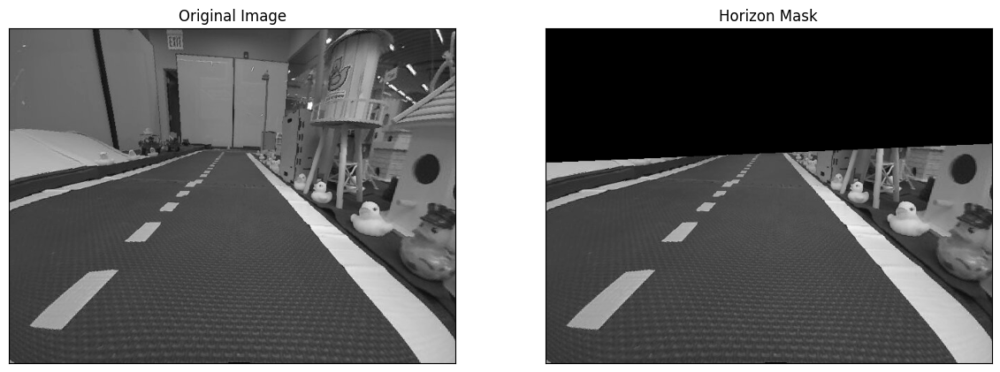

In [5]:
# Using H

height, width = img.shape

# Create a grid of (j, i) coordinates across the image, indexed like (x, y)
j_points, i_points = np.meshgrid(np.arange(width), np.arange(height), indexing='xy')

# Stack (j, i) coordinates with a row of ones for homogeneous coordinates
pixel_points = np.stack([j_points, i_points, np.ones_like(j_points)], axis=-1)

# Homography (only H -> image to ground) transformation broadcasted
projected_points = pixel_points @ H.T

# Normalize by the third (homogeneous) coordinate
ground_x_position = projected_points[..., 0] / projected_points[..., 2]

# Create the mask based on x-coordinates constraints (keep between 0 and 5 "meters" ahead)
mask_ground = ((ground_x_position >= 0) & (ground_x_position <= 5)).astype(np.uint8)

# Display the original image without any mask
fig = plt.figure(figsize=(30, 20))

# Add the original image plot
ax0 = fig.add_subplot(1, 4, 1)
ax0.imshow(img, cmap='gray')
ax0.set_title('Original Image')
ax0.set_xticks([])
ax0.set_yticks([])

# Plot the image with the mask applied (Horizon Mask)
ax1 = fig.add_subplot(1, 4, 2)
ax1.imshow(img * mask_ground, cmap='gray')
ax1.set_title('Horizon Mask')
ax1.set_xticks([])
ax1.set_yticks([])

plt.show()

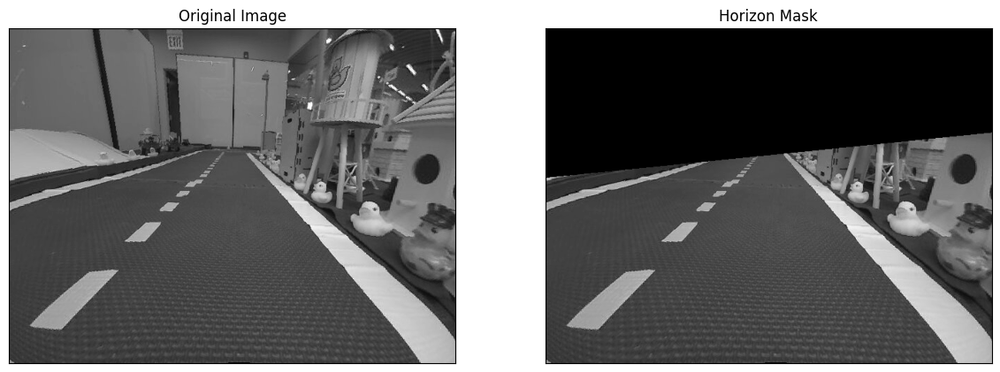

In [6]:
# Using Hinv?
height, width = img.shape

# Create a grid of pixel coordinates (i, j) across the image using "ij"
j_coords, i_coords = np.meshgrid(np.arange(height), np.arange(width), indexing='xy')

# Stack i, j, and a row of ones for homogeneous coordinates
pixel_points = np.stack([j_coords, i_coords, np.ones_like(j_coords)], axis=-1)

# Apply the inverse homography transformation to all points at once (width, height, 3)
projected_points = pixel_points @ Hinv.T  # homography (technically Hinv) ?

# Normalize by the third (homogeneous) coordinate
ground_x_position = projected_points[..., 1] / projected_points[..., 2]
mask_ground = (ground_x_position > (-193000 / projected_points[..., 2])).astype(np.uint8).T
# mask_ground = (ground_image > (-200000 / projected_points[..., 2])).astype(np.uint8)

# Display the original image without any mask
fig = plt.figure(figsize=(30, 20))

# Add the original image plot
ax0 = fig.add_subplot(1, 4, 1)
ax0.imshow(img, cmap='gray')
ax0.set_title('Original Image')
ax0.set_xticks([])
ax0.set_yticks([])

# Plot the image with the mask applied (Horizon Mask)
ax1 = fig.add_subplot(1, 4, 2)
# ax1.imshow(img * mask_ground, cmap='gray')
ax1.imshow(mask_ground*img, cmap='gray')
ax1.set_title('Horizon Mask')
ax1.set_xticks([])
ax1.set_yticks([])

plt.show()

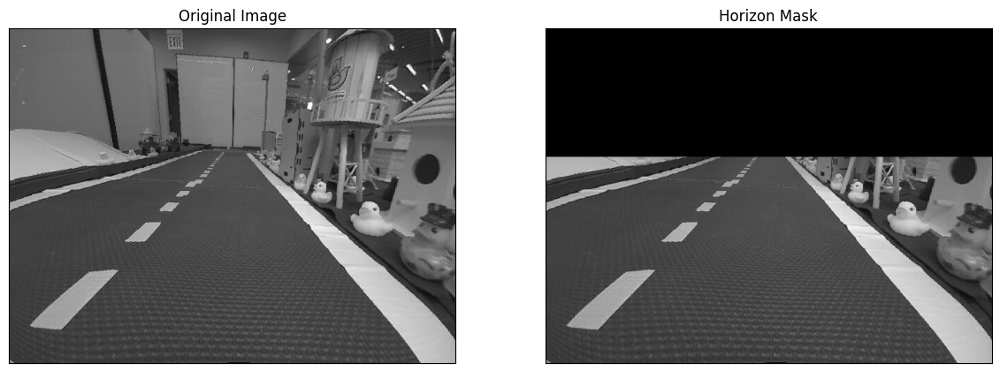

In [7]:
# Only one point on the ground, projected using Hinv
height, width = img.shape
mask_ground = np.ones(img.shape, dtype=np.uint8)

# Calculate the x-coordinate of the horizon using a point in the upper middle
point = np.array([height // 2, width // 2, 1])
projected_point = Hinv @ point
x_horizon = int(projected_point[1] / projected_point[2])  # Convert to integer for indexing
mask_ground[:x_horizon, :] = 0  # Set rows above x_horizon to 0

# Display the original image without any mask
fig = plt.figure(figsize=(30, 20))

# Add the original image plot
ax0 = fig.add_subplot(1, 4, 1)
ax0.imshow(img, cmap='gray')
ax0.set_title('Original Image')
ax0.set_xticks([])
ax0.set_yticks([])

# Plot the image with the mask applied (Horizon Mask)
ax1 = fig.add_subplot(1, 4, 2)
# ax1.imshow(img * mask_ground, cmap='gray')
ax1.imshow(mask_ground*img, cmap='gray')
ax1.set_title('Horizon Mask')
ax1.set_xticks([])
ax1.set_yticks([])

plt.show()

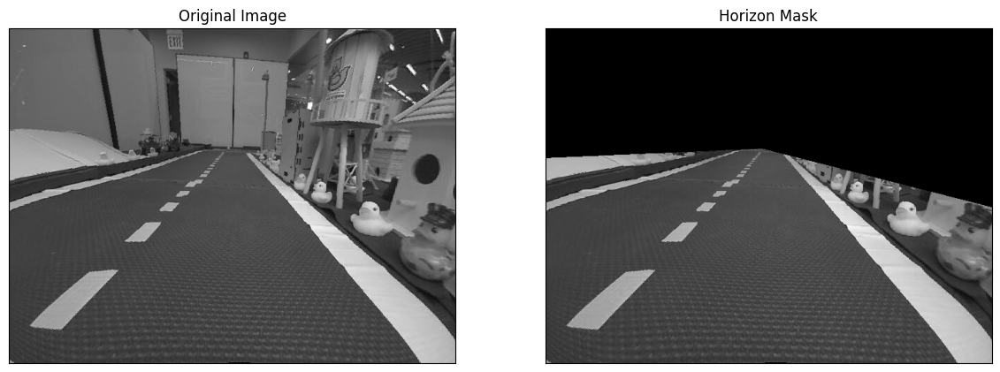

In [8]:
# Only one point on the ground, projected using Hinv
height, width = img.shape

# Using OpenCV
mask_ground = np.ones(img.shape, dtype=np.uint8)
mask_ground = cv2.warpPerspective(mask_ground, Hinv, (width, height))
mask_ground[:140] = 0

# Display the original image without any mask
fig = plt.figure(figsize=(30, 20))

# Add the original image plot
ax0 = fig.add_subplot(1, 4, 1)
ax0.imshow(img, cmap='gray')
ax0.set_title('Original Image')
ax0.set_xticks([])
ax0.set_yticks([])

# Plot the image with the mask applied (Horizon Mask)
ax1 = fig.add_subplot(1, 4, 2)
# ax1.imshow(img * mask_ground, cmap='gray')
ax1.imshow(mask_ground*img, cmap='gray')
ax1.set_title('Horizon Mask')
ax1.set_xticks([])
ax1.set_yticks([])

plt.show()

## Detecting Lane Markings using Sobel Edge Detection

Now, let's apply the Sobel operator to the image to identify image gradients.

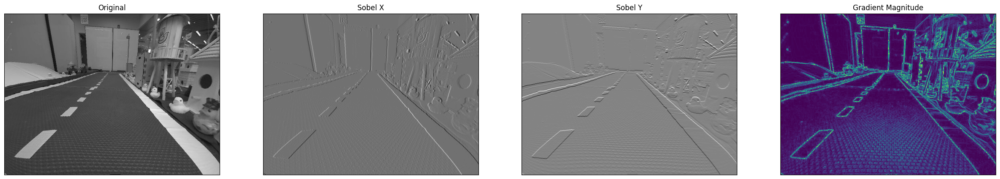

In [9]:
# Convolve the image with the Sobel operator (filter) to compute the numerical derivatives in the x and y directions
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1)

# # Compute the magnitude of the gradients
Gmag = np.sqrt(sobelx * sobelx + sobely * sobely)

# Compute the orientation of the gradients
Gdir = cv2.phase(np.array(sobelx, np.float32), np.array(sobely, dtype=np.float32), angleInDegrees=True)

fig = plt.figure(figsize = (30,20))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(img,cmap = 'gray')
ax1.set_title('Original'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(sobelx,cmap = 'gray')
ax2.set_title('Sobel X'), ax2.set_xticks([]), ax2.set_yticks([])
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(sobely,cmap = 'gray')
ax3.set_title('Sobel Y'), ax3.set_xticks([]), ax3.set_yticks([]);
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(np.uint8(Gmag))
ax4.set_title('Gradient Magnitude'), ax4.set_xticks([]), ax4.set_yticks([]);

Filtering the image has enhanced the location of the lane markings, but has also emphasized other locations where there are rapid changes in intensity. These include the duckies, buildings in Duckietown, the road surface, and elements in the background (e.g., the lights in the upper-right corner of the image). Note that we are using a non-grayscale colormap for the gradient magnitudes in order to more clearly convey locations that are enhanced by the Sobel operator.

We can reduce the occurrence of some of these features by first blurring the filter using a Gaussian kernel.

## Gaussian Blurring

The Sobel operator picks up on noise in the image as well as texture in the scene that we don't particularly care about. We can blur the image with a Gaussian kernel to reduce these spurious detections.

### Example: Gaussian Blurring

Using your experience from the previous exercise, identify a setting for the standard deviation of the Gaussian kernel that removes noise and local texture (e.g., that of the road surface), without sacrificing too much valid content (namely, the edges associated with lane markings)

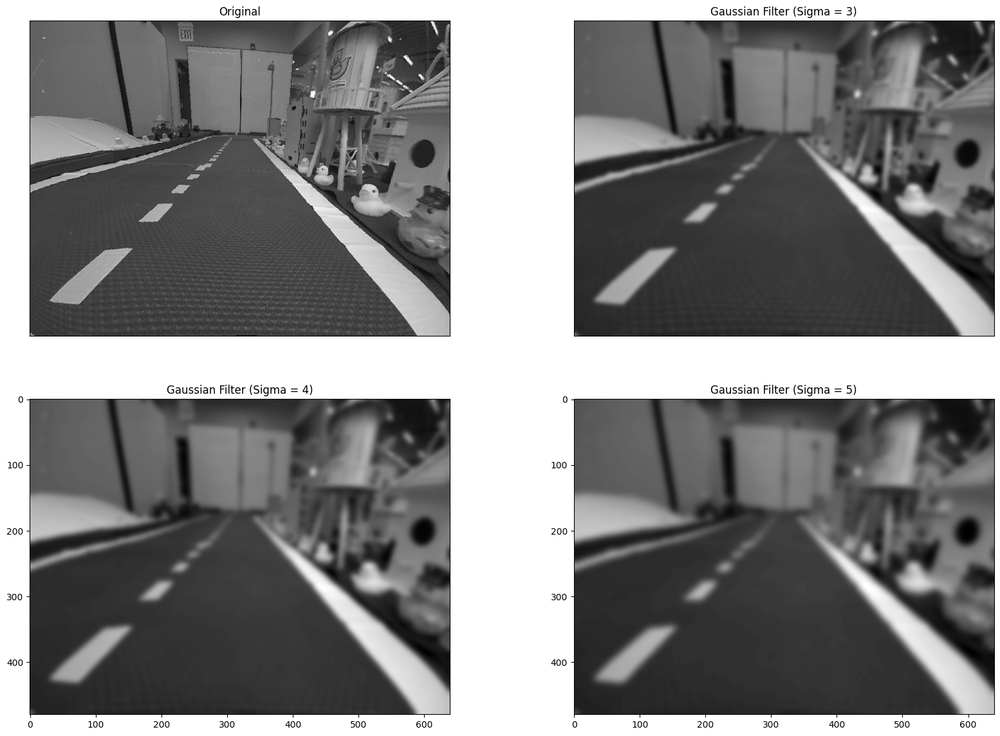

In [10]:
# TODO: Identify a setting for the standard deviation that removes noise while not eliminating too much valid content.
sigma = 3 # CHANGE ME

# Smooth the image using a Gaussian kernel
img_gaussian_filter = cv2.GaussianBlur(img,(0,0), sigma)

sigma_1 = 4
sigma_2 = 5
img_gaussian_filter_1 = cv2.GaussianBlur(img,(0,0), sigma_1)

img_gaussian_filter_2 = cv2.GaussianBlur(img,(0,0), sigma_2)

# Visualize the filtered image alongside the original image.
fig = plt.figure(figsize = (20,14))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img,cmap = 'gray')
ax1.set_title('Original'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(img_gaussian_filter,cmap = 'gray')
ax2.set_title('Gaussian Filter (Sigma = ' + str(sigma) +')'), ax2.set_xticks([]), ax2.set_yticks([]);
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(img_gaussian_filter_1,cmap = 'gray')
ax3.set_title('Gaussian Filter (Sigma = ' + str(sigma_1) +')'), ax2.set_xticks([]), ax2.set_yticks([]);
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_gaussian_filter_2,cmap = 'gray')
ax4.set_title('Gaussian Filter (Sigma = ' + str(sigma_2) +')'), ax2.set_xticks([]), ax2.set_yticks([]);

Now, let's look at the gradients of the blurred image. For this exercise, experiment with different settings for the standard deviation above and see how they affect the image gradients. In particular, compare the gradients for two extremes of the standard deviation (e.g., $\sigma=1$ and $\sigma=10$).

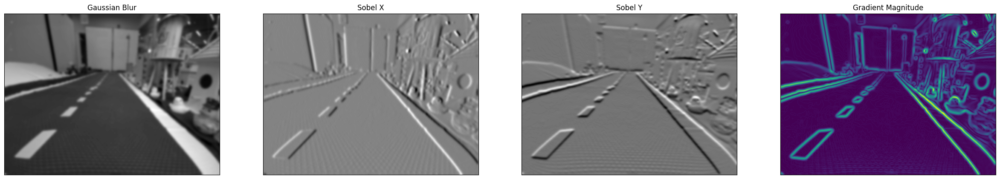

In [11]:
# Convolve the image with the Sobel operator (filter) to compute the numerical derivatives in the x and y directions
sobelx = cv2.Sobel(img_gaussian_filter,cv2.CV_64F,1,0)
sobely = cv2.Sobel(img_gaussian_filter,cv2.CV_64F,0,1)

# Compute the magnitude of the gradients
Gmag = np.sqrt(sobelx*sobelx + sobely*sobely)

# Compute the orientation of the gradients
Gdir = cv2.phase(np.array(sobelx, np.float32), np.array(sobely, dtype=np.float32), angleInDegrees=True)

fig = plt.figure(figsize = (30,20))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(img_gaussian_filter,cmap = 'gray')
ax1.set_title('Gaussian Blur'), ax1.set_xticks([]), ax1.set_yticks([]);
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(sobelx,cmap = 'gray')
ax2.set_title('Sobel X'), ax2.set_xticks([]), ax2.set_yticks([]);
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(sobely,cmap = 'gray')
ax3.set_title('Sobel Y'), ax3.set_xticks([]), ax3.set_yticks([]);
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(np.uint8(Gmag))
ax4.set_title('Gradient Magnitude'), ax4.set_xticks([]), ax4.set_yticks([]);

## A Varient of Non-maximal Supression

With a suitable choice for the standard deviation, we have smoothed out some of the noise and texture in the image (e.g., the road), reducing the number of candidate edges while preserving most of the edges that corresopnd to lane markings.

Under the assumption that the edges associated with lane markings are stronger than most of the edges in the image (in terms of the magnitude of the gradients), we can further eliminate distractors by only keeping edges whose gradient magnitude is greater than a threshold. 

### Example: A form of non-maximal supression

In this exercise, we will take a look at the histogram over gradient magnitudes to better understand the distribution of gradient magnitudes. Based on the histogram, we can choose a magnitude threshold that we will use to filter out weaker edges.

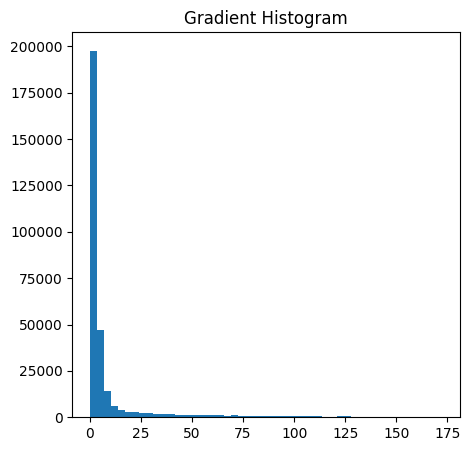

In [12]:
# Visualize the histogram over gradient magnitudes
fig = plt.figure(figsize = (5,5))
ax1 = fig.add_subplot(1,1,1)
ax1.hist((Gmag*mask_ground).flatten(), bins=50)
ax1.set_title('Gradient Histogram');

threshold: 50
threshold_yellow: 34.0
threshold_white: 43.0


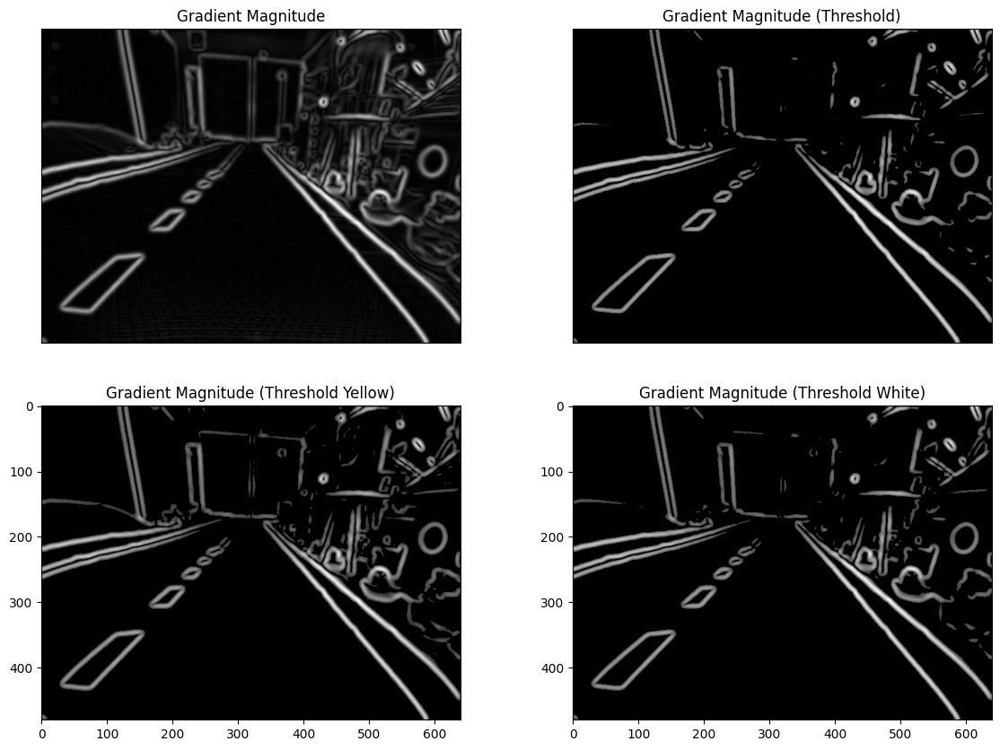

In [13]:
# TODO: Use the histogram above to choose the minimum threshold on the gradient magnitude. 
#       Edges whos gradient magnitude is below this threshold will be filtered out.
threshold = 50 # CHANGE ME
mask_mag = Gmag > threshold
print("threshold:", threshold)

threshold_yellow = np.max(Gmag) // 5 # CHANGE ME
threshold_white = np.max(Gmag) // 4 # CHANGE ME

mask_mag_yellow = Gmag > threshold_yellow
mask_mag_white = Gmag > threshold_white
print("threshold_yellow:", threshold_yellow)
print("threshold_white:", threshold_white)

fig = plt.figure(figsize = (14,10))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(Gmag, cmap = 'gray')
ax1.set_title('Gradient Magnitude'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(mask_mag*Gmag,cmap = 'gray')
ax2.set_title('Gradient Magnitude (Threshold)'), ax2.set_xticks([]), ax2.set_yticks([]);
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(mask_mag_yellow*Gmag,cmap = 'gray')
ax3.set_title('Gradient Magnitude (Threshold Yellow)'), ax2.set_xticks([]), ax2.set_yticks([]);
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(mask_mag_white*Gmag,cmap = 'gray')
ax4.set_title('Gradient Magnitude (Threshold White)'), ax2.set_xticks([]), ax2.set_yticks([]);

## Color-based Masking

Having identified a candidate set of edges, we can now try to design a set of masks that isolate the edges associated with the dashed-yellow and solid-white lane markings.

Perhaps the most obvious thing to do is to create masks that filter out pixels whose color differs from that of the yellow and white lines. 

### Example: Color-based Masking

We can select upper- and lower-bounds on the HSV values for the two lines. One option is to use [this online color picker](https://pinetools.com/image-color-picker), which allows us to get the HSV values for particular pixels. 

**Note**: When we go to use these bounds, remember that OpenCV uses uses the convention that $\textrm{H} \in [0, 179]$, $\textrm{S} \in [0, 255]$, and $\textrm{V} \in [0, 255]$, while other tools may use different ranges (e.g., Gimp uses $\textrm{H} \in [0, 360]$, $\textrm{S} \in [0, 100]$, and $\textrm{V} \in [0, 100])$. Regardless of the color picker you use, always double-check whether it uses a different convention for HSV ranges. If it does, make sure to convert the result to the OpenCV's convention.

**Note**: While the HSV color space provides a better representation (e.g., compared to RGB) for color-based detection, the appearance of the yellow and white lane markings will change due to variations in illumination, shading, etc. for In order to improve the generalizability of these bounds, you are encouraged to also consider the `../../assets/images/visual_control/pic3_rect.png` image and define bounds that are appropriate for both.

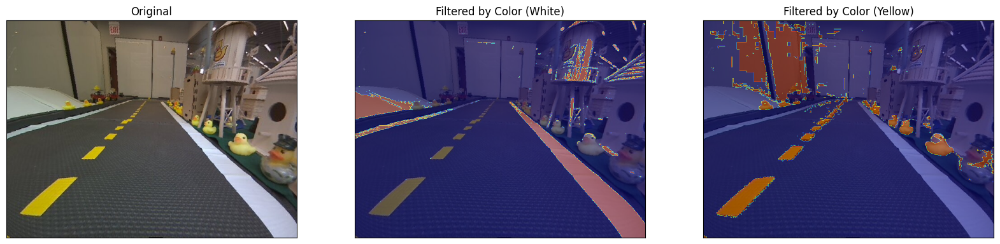

In [14]:
# Using the above tool, we can identify the bounds as follows
# TODO: Identify the lower and upper HSV bounds for the white and yellow lane markings
#       These values represent the maximum range, so they don't filter out anything

# Old
# white_lower_hsv = np.array([0, 0, 140])
# white_upper_hsv = np.array([179, 80, 255])
# yellow_lower_hsv = np.array([20, 75, 110])
# yellow_upper_hsv = np.array([45, 255, 255])

# White threshold is higher to compress the noise of the floor
# Yellow threshold allows for more range, since less rectnagular yellow objects exist
white_lower_hsv = np.array([0, 0, 167])
white_upper_hsv = np.array([179, 65, 255])
yellow_lower_hsv = np.array([20, 60, 75])
yellow_upper_hsv = np.array([45, 255, 255])

mask_white = cv2.inRange(imghsv, white_lower_hsv, white_upper_hsv)
mask_yellow = cv2.inRange(imghsv, yellow_lower_hsv, yellow_upper_hsv)

fig = plt.figure(figsize = (20,10))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(imgrgb)
ax1.set_title('Original'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(1,3,2)
ax2.imshow(imgrgb)
ax2.imshow(mask_white, cmap='jet', alpha=0.5)
ax2.set_title('Filtered by Color (White)'), ax2.set_xticks([]), ax2.set_yticks([]);
ax3 = fig.add_subplot(1,3,3)
ax3.imshow(imgrgb)
ax3.imshow(mask_yellow, cmap='jet', alpha=0.5)
ax3.set_title('Filtered by Color (Yellow)'), ax3.set_xticks([]), ax3.set_yticks([]);

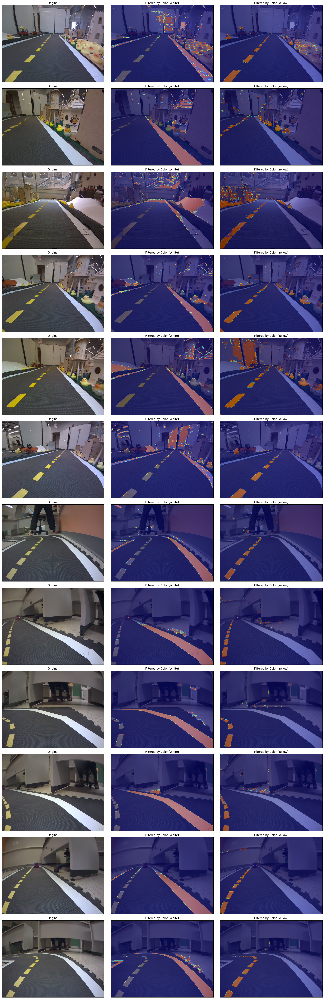

In [15]:
import glob
imdir1 = '../../assets/images/visual_control/pic*.png'
imdir2 = '../../images/*.png'

image_paths_list = glob.glob(imdir1) + glob.glob(imdir2)

def test_every_images(image_paths_list):
    # Set up the figure size
    fig = plt.figure(figsize=(20, len(image_paths_list) * 5))

    # Loop over each image path, read and process each image one at a time
    for i, image_path in enumerate(image_paths_list):
        # Load the image
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for displaying
        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)  # Convert to HSV for filtering

        mask_white = cv2.inRange(img_hsv, white_lower_hsv, white_upper_hsv)
        mask_yellow = cv2.inRange(img_hsv, yellow_lower_hsv, yellow_upper_hsv)

        ax1 = fig.add_subplot(len(image_paths_list), 3, i * 3 + 1)
        ax1.imshow(img_rgb)
        ax1.set_title('Original')
        ax1.set_xticks([]), ax1.set_yticks([])

        ax2 = fig.add_subplot(len(image_paths_list), 3, i * 3 + 2)
        ax2.imshow(img_rgb)
        ax2.imshow(mask_white, cmap='jet', alpha=0.5)
        ax2.set_title('Filtered by Color (White)')
        ax2.set_xticks([]), ax2.set_yticks([])

        ax3 = fig.add_subplot(len(image_paths_list), 3, i * 3 + 3)
        ax3.imshow(img_rgb)
        ax3.imshow(mask_yellow, cmap='jet', alpha=0.5)
        ax3.set_title('Filtered by Color (Yellow)')
        ax3.set_xticks([]), ax3.set_yticks([])

    plt.tight_layout()
    plt.show()

test_every_images(image_paths_list)

## Edge-based Masking

Now, we will explore possible ways to mask out unwanted edges based upon their orientation in the image.

Assuming that the Duckiebot hasn't deviated too much from its lane, most of the dashed-yellow line should lie in the left-half of the image, while most of the solid-white line should lie in the right-half of the image. We can use this to reason separately over dashed-yellow and solid-white lane markings.

**Note**: While this masking may seem reasonable when the Duckiebot is oriented close to the direction of travel, it may not be what we want when the Duckiebot's orientation is off. In these cases, we would expect some of the dashed-yellow lane markings to be in the right-half of the image or some of the solid-white lane markings to be in the left-half of the image. These would be valuable cues to use. Thus, as you experiment with the included images as well as in simulation and on your physical Duckiebot, you may want to try disabling these masks.

### Example: Edge-based Masking

In [16]:
# Let's create masks for the left- and right-halves of the image
width = img.shape[1]
mask_left = np.ones(sobelx.shape)
mask_left[:, int(np.floor(width / 2)) : width + 1] = 0
mask_right = np.ones(sobelx.shape)
mask_right[:, 0 : int(np.floor(width / 2))] = 0

The inner edge of the dashed-yellow line corresponds to a negative gradient in the $x$- and $y$-directions, while the inner-edge of the solid-white line corresponds to a positive gradient in the $x$-direction and negative gradient in the $y$-direction. We can use this to further mask out unwanted edges.

In [17]:
# In the left-half image, we are interested in the right-half of the dashed yellow line, which corresponds to negative x- and y-derivatives
# In the right-half image, we are interested in the left-half of the solid white line, which correspons to a positive x-derivative and a negative y-derivative
# Generate a mask that identifies pixels based on the sign of their x-derivative
mask_sobelx_pos = sobelx > 0
mask_sobelx_neg = sobelx < 0
mask_sobely_pos = sobely > 0
mask_sobely_neg = sobely < 0

Now, lets combine these masks to see their effect on the edge detections, but let's look at the effects of the gradient-based masks before including those based on color.

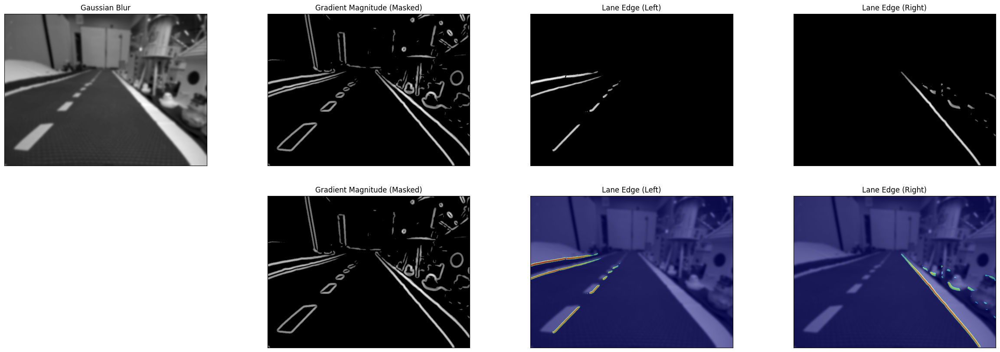

In [18]:
# Let's combine these masks with the gradient magnitude mask
mask_left_edge = mask_ground * mask_left * mask_mag * mask_sobelx_neg * mask_sobely_neg
mask_right_edge = mask_ground * mask_right * mask_mag * mask_sobelx_pos * mask_sobely_neg

fig = plt.figure(figsize = (30,10))
ax1 = fig.add_subplot(2,4,1)
ax1.imshow(img_gaussian_filter,cmap = 'gray')
ax1.set_title('Gaussian Blur'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(2,4,2)
ax2.imshow(mask_mag*Gmag,cmap = 'gray')
ax2.set_title('Gradient Magnitude (Masked)'), ax2.set_xticks([]), ax2.set_yticks([])
ax3 = fig.add_subplot(2,4,3)
ax3.imshow(Gmag * mask_left_edge, cmap = 'gray')
ax3.set_title('Lane Edge (Left)'), ax3.set_xticks([]), ax3.set_yticks([])
ax4 = fig.add_subplot(2,4,4)
ax4.imshow(Gmag * mask_right_edge,cmap = 'gray')
ax4.set_title('Lane Edge (Right)'), ax4.set_xticks([]), ax4.set_yticks([]);

ax6 = fig.add_subplot(2,4,6)
ax6.imshow(mask_mag*Gmag,cmap = 'gray')
ax6.set_title('Gradient Magnitude (Masked)'), ax6.set_xticks([]), ax6.set_yticks([])
ax7 = fig.add_subplot(2,4,7)
ax7.imshow(img_gaussian_filter,cmap = 'gray')
ax7.imshow(Gmag * mask_left_edge, cmap='jet', alpha=0.5)
ax7.set_title('Lane Edge (Left)'), ax7.set_xticks([]), ax7.set_yticks([])
ax8 = fig.add_subplot(2,4,8)
ax8.imshow(img_gaussian_filter,cmap = 'gray')
ax8.imshow(Gmag * mask_right_edge, cmap='jet', alpha=0.5)
ax8.set_title('Lane Edge (Right)'), ax8.set_xticks([]), ax8.set_yticks([]);

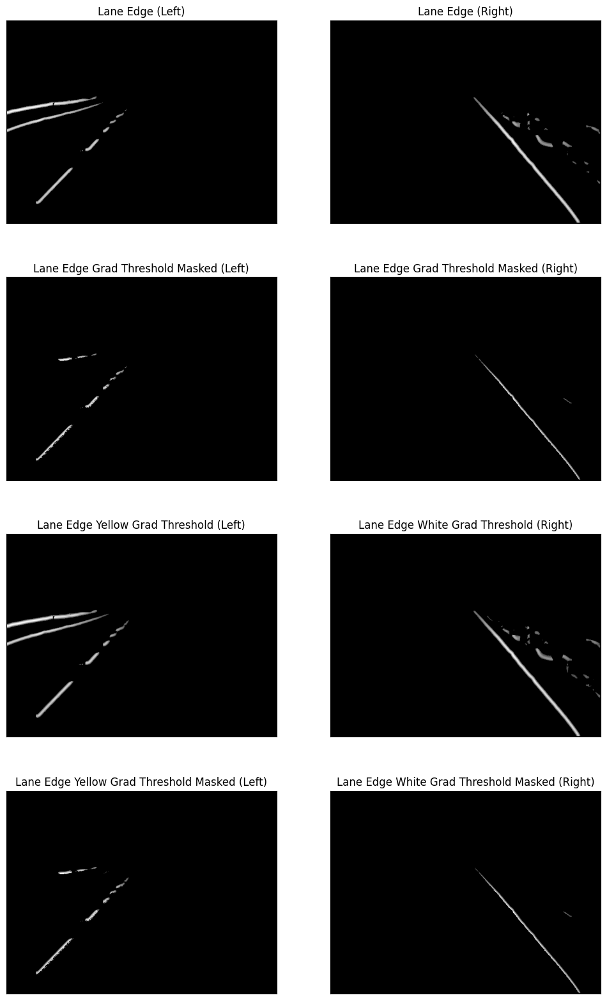

In [19]:
mask_left_edge_same_g = mask_ground * mask_left * mask_mag * mask_sobelx_neg * mask_sobely_neg
mask_right_edge_same_g = mask_ground * mask_right * mask_mag * mask_sobelx_pos * mask_sobely_neg

mask_left_edge_diff_g = mask_ground * mask_left * mask_mag_yellow * mask_sobelx_neg * mask_sobely_neg
mask_right_edge_diff_g = mask_ground * mask_right * mask_mag_white * mask_sobelx_pos * mask_sobely_neg

fig = plt.figure(figsize = (12,20))
ax1 = fig.add_subplot(4,2,1)
ax1.imshow(Gmag * mask_left_edge_same_g,cmap = 'gray')
ax1.set_title('Lane Edge (Left)'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(4,2,2)
ax2.imshow(Gmag * mask_right_edge_same_g,cmap = 'gray')
ax2.set_title('Lane Edge (Right)'), ax2.set_xticks([]), ax2.set_yticks([])
ax3 = fig.add_subplot(4,2,5)
ax3.imshow(Gmag * mask_left_edge_diff_g, cmap = 'gray')
ax3.set_title('Lane Edge Yellow Grad Threshold (Left)'), ax3.set_xticks([]), ax3.set_yticks([])
ax4 = fig.add_subplot(4,2,6)
ax4.imshow(Gmag * mask_right_edge_diff_g,cmap = 'gray')
ax4.set_title('Lane Edge White Grad Threshold (Right)'), ax4.set_xticks([]), ax4.set_yticks([]);
ax5 = fig.add_subplot(4,2,7)
ax5.imshow(Gmag * mask_left_edge_diff_g * mask_yellow, cmap = 'gray')
ax5.set_title('Lane Edge Yellow Grad Threshold Masked (Left)'), ax5.set_xticks([]), ax5.set_yticks([])
ax6 = fig.add_subplot(4,2,8)
ax6.imshow(Gmag * mask_right_edge_diff_g * mask_white,cmap = 'gray')
ax6.set_title('Lane Edge White Grad Threshold Masked (Right)'), ax6.set_xticks([]), ax6.set_yticks([]);
ax7 = fig.add_subplot(4,2,3)
ax7.imshow(Gmag * mask_left_edge_same_g * mask_yellow, cmap = 'gray')
ax7.set_title('Lane Edge Grad Threshold Masked (Left)'), ax7.set_xticks([]), ax7.set_yticks([])
ax8 = fig.add_subplot(4,2,4)
ax8.imshow(Gmag * mask_right_edge_same_g * mask_white,cmap = 'gray')
ax8.set_title('Lane Edge Grad Threshold Masked (Right)'), ax8.set_xticks([]), ax8.set_yticks([]);


We see that the inclusion of (a simple version of) non-maximal supression together with masking based on the image gradients has helped to filter out many of the distractor edges. However, the "Lane Edge (Left)" gradients include edges that don't correspond to lane markings (i.e., the bright-to-dark transition at the edge of the road). The "Lane Edge (Right)" gradients better isolate the edge caused by the solid-white line.

### Example: Dominant Gradient Orientations

Now, we want to estimate the gradient orientations for the dashed-yellow and solid-white lane markings. To that end, let's look at the gradient histogram for the left edge and right edge images.

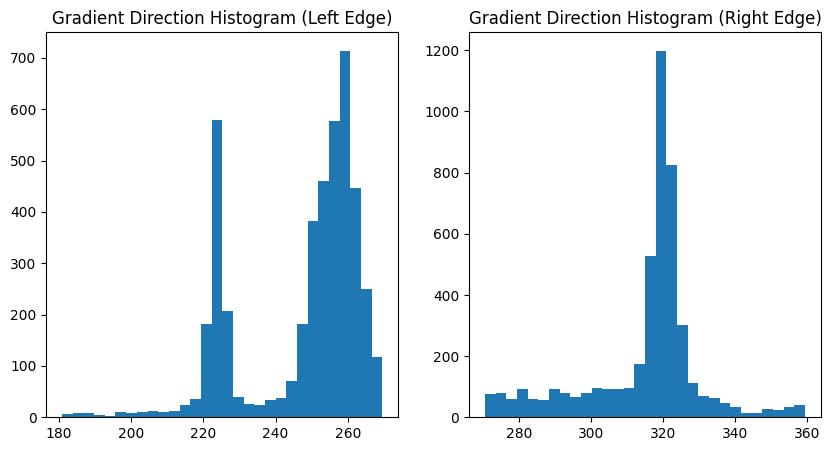

In [20]:
# Now, let's apply the mask to our gradient directions
fig = plt.figure(figsize = (10,5))
ax1 = fig.add_subplot(1,2,1)
ax1.hist(np.extract(mask_left_edge, Gdir).flatten(), bins=30)
ax1.set_title('Gradient Direction Histogram (Left Edge)')
ax2 = fig.add_subplot(1,2,2)
ax2.hist(np.extract(mask_right_edge, Gdir).flatten(), bins=30)
ax2.set_title('Gradient Direction Histogram (Right Edge)');

Looking at the gradient histogram for the "Right Edge", we see that the large majority of the edges have an orientation around 315 degrees, while there are few outliers with orientations between 0 and 100 degrees and between 250 and 350 degrees. This is consistent with the gradients that we visualize above in the "Lane Edge (Right)" images above. The ~315 degree orientation is consistent with the dominant edge associated with the solid-white lane marking (i.e., the gradient points to the upper-right).

Now, let's incorporate the color-based masks.

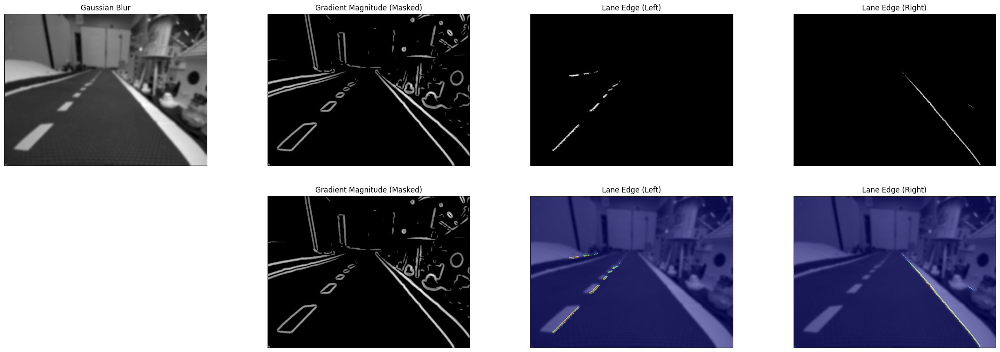

In [21]:
# Let's generate the complete set of masks, including those based on color
mask_left_edge = mask_ground * mask_left * mask_mag * mask_sobelx_neg * mask_sobely_neg * mask_yellow
mask_right_edge = mask_ground * mask_right * mask_mag * mask_sobelx_pos * mask_sobely_neg * mask_white

# mask_left_edge = mask_ground * mask_left * mask_mag_yellow * mask_sobelx_neg * mask_sobely_neg * mask_yellow
# mask_right_edge = mask_ground * mask_right * mask_mag_white * mask_sobelx_pos * mask_sobely_neg * mask_white

# mask_left_edge = mask_ground * mask_left * mask_mag * (mask_sobelx_neg + mask_sobely_neg) / 2 * mask_yellow
# mask_right_edge = mask_ground * mask_right * mask_mag * (mask_sobelx_pos + mask_sobely_neg) / 2  * mask_white

fig = plt.figure(figsize = (30,10))
ax1 = fig.add_subplot(2,4,1)
ax1.imshow(img_gaussian_filter,cmap = 'gray')
ax1.set_title('Gaussian Blur'), ax1.set_xticks([]), ax1.set_yticks([])
ax2 = fig.add_subplot(2,4,2)
ax2.imshow(mask_mag*Gmag,cmap = 'gray')
ax2.set_title('Gradient Magnitude (Masked)'), ax2.set_xticks([]), ax2.set_yticks([])
ax3 = fig.add_subplot(2,4,3)
ax3.imshow(Gmag * mask_left_edge, cmap = 'gray')
ax3.set_title('Lane Edge (Left)'), ax3.set_xticks([]), ax3.set_yticks([])
ax4 = fig.add_subplot(2,4,4)
ax4.imshow(Gmag * mask_right_edge,cmap = 'gray')
ax4.set_title('Lane Edge (Right)'), ax4.set_xticks([]), ax4.set_yticks([]);

ax6 = fig.add_subplot(2,4,6)
ax6.imshow(mask_mag*Gmag,cmap = 'gray')
ax6.set_title('Gradient Magnitude (Masked)'), ax6.set_xticks([]), ax6.set_yticks([])
ax7 = fig.add_subplot(2,4,7)
ax7.imshow(img_gaussian_filter,cmap = 'gray')
ax7.imshow(Gmag * mask_left_edge, cmap='jet', alpha=0.5)
ax7.set_title('Lane Edge (Left)'), ax7.set_xticks([]), ax7.set_yticks([])
ax8 = fig.add_subplot(2,4,8)
ax8.imshow(img_gaussian_filter,cmap = 'gray')
ax8.imshow(Gmag * mask_right_edge, cmap='jet', alpha=0.5)
ax8.set_title('Lane Edge (Right)'), ax8.set_xticks([]), ax8.set_yticks([]);

We can see that incorporating the color-based masks has removed most if not all of the outliers, but has also removed some of the valid edges, particularly those associated with the solid-white lane markings.

Let's look at the corresponding historgrams.

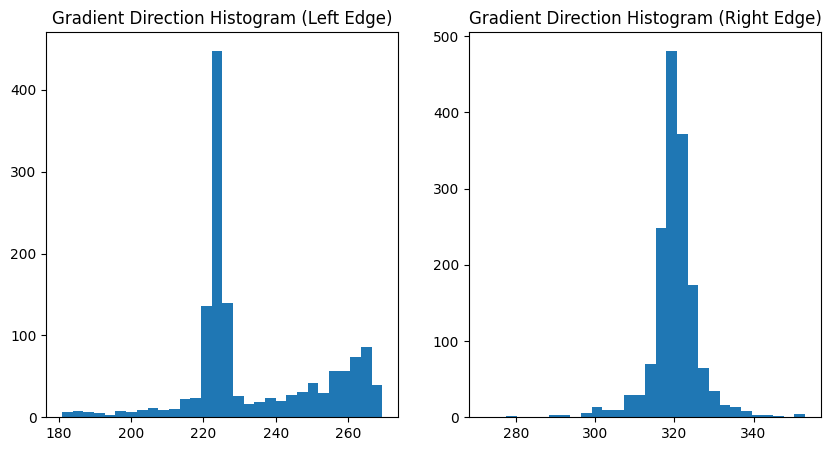

In [22]:
# Now, let's apply the full set of masks to our gradient directions
fig = plt.figure(figsize = (10,5))
ax1 = fig.add_subplot(1,2,1)
ax1.hist(np.extract(mask_left_edge, Gdir).flatten(), bins=30)
ax1.set_title('Gradient Direction Histogram (Left Edge)')
ax2 = fig.add_subplot(1,2,2)
ax2.hist(np.extract(mask_right_edge, Gdir).flatten(), bins=30)
ax2.set_title('Gradient Direction Histogram (Right Edge)');

Consistent with what we saw above, incorporating the color-based masks has effectively removed the large number of edges that lead to a dominant mode around 260 degrees in the previous histogram for the left edge. Now, there is a single dominant mode for each of the edges.

Now, you might be wondering why we don't use these angles for control. Afterall, you might expect that we could use any deviations in the gradient orientations associated with the left and right lane markings in order to steer the vehicle back into the lane. However, the image-space orientations don't change significantly as the vehicle's orientation relative to the lane changes, implying that there isn't as much useful signal here as we might expect

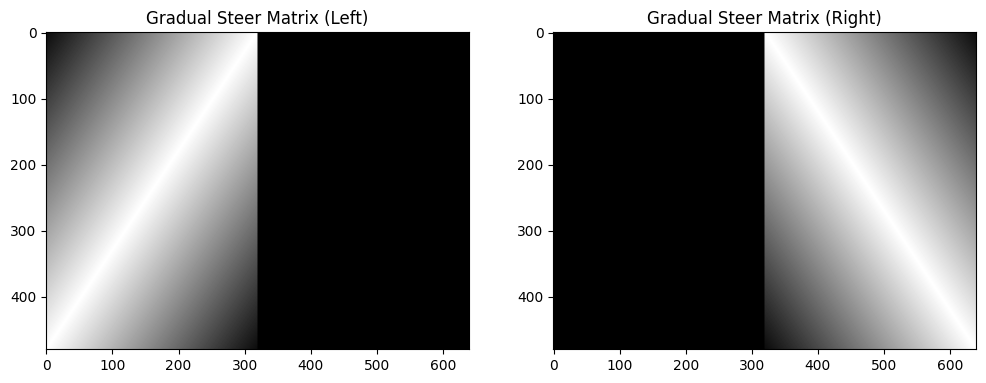

In [23]:
def generate_steer_left_matrix(shape):
    half = shape[1] // 2
    steer_matrix_left = np.zeros(shape)
    
    # Define coordinates for each pixel in the left half
    y_coords, x_coords = np.indices((shape[0], half))
    
    # Calculate distance from each pixel to the diagonal line from (0,480) to (320,0)
    x_target, y_target = 320, 0
    x_origin, y_origin = 0, shape[0]
    distance = np.abs((y_target - y_origin) * x_coords - (x_target - x_origin) * y_coords +
                      x_target * y_origin - y_target * x_origin).astype(np.float64)
    distance /= np.sqrt((y_target - y_origin) ** 2 + (x_target - x_origin) ** 2)
    
    # Calculate the weights based on distance
    steer_matrix_left[:, :half] = 0.3 * (1 - np.clip(distance * 1.15 / half, 0, 1))
    
    return steer_matrix_left

def generate_steer_right_matrix(shape):
    half = shape[1] // 2
    steer_matrix_right = np.zeros(shape)
    
    # Define coordinates for each pixel in the right half
    y_coords, x_coords = np.indices((shape[0], half))
    x_coords = x_coords + half  # Adjust x coordinates to cover the right half
    
    # Calculate distance from each pixel to the diagonal line from (320,0) to (640,480)
    x_target, y_target = half, 0
    x_origin, y_origin = shape[1], shape[0]
    distance = np.abs((y_target - y_origin) * x_coords - (x_target - x_origin) * y_coords +
                      x_target * y_origin - y_target * x_origin).astype(np.float64)
    distance /= np.sqrt((y_target - y_origin) ** 2 + (x_target - x_origin) ** 2)
    
    # Calculate the weights based on distance
    steer_matrix_right[:, half:] = 0.2 * (1 - np.clip(distance * 1.15 / half, 0, 1))
    
    return -steer_matrix_right

steer_left_matrix = generate_steer_left_matrix(img.shape)
steer_right_matrix = generate_steer_right_matrix(img.shape)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(steer_left_matrix * mask_left, cmap="gray")
ax1.set_title("Gradual Steer Matrix (Left)")
ax2.imshow(-steer_right_matrix * mask_right, cmap="gray")
ax2.set_title("Gradual Steer Matrix (Right)")
plt.show()

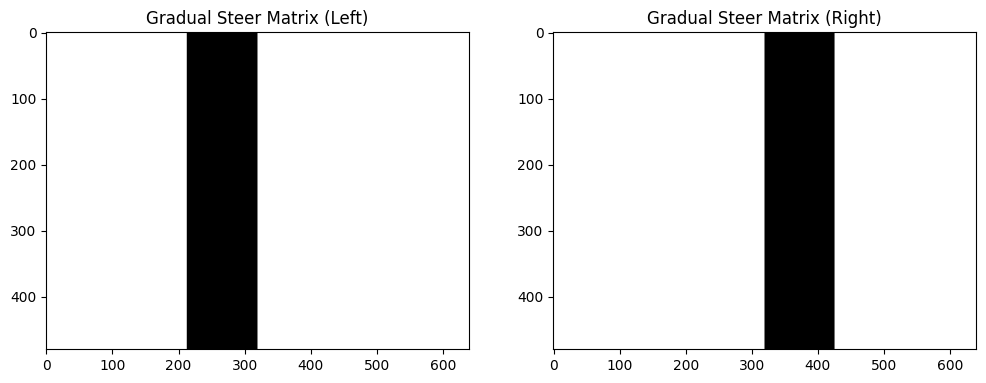

In [24]:
# Default
def generate_steer_left_matrix(shape):
    steer_matrix_left = np.zeros(shape)
    steer_matrix_left[:, shape[1] * 1 // 3:] = -1
    return steer_matrix_left

def generate_steer_right_matrix(shape):
    steer_matrix_right = np.zeros(shape)
    steer_matrix_right[:, : shape[1] * 2 // 3] = 1
    return steer_matrix_right

steer_left_matrix = generate_steer_left_matrix(img.shape)
steer_right_matrix = generate_steer_right_matrix(img.shape)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(steer_left_matrix * mask_left, cmap="gray")
ax1.set_title("Gradual Steer Matrix (Left)")
ax2.imshow(-steer_right_matrix * mask_right, cmap="gray")
ax2.set_title("Gradual Steer Matrix (Right)")
plt.show()

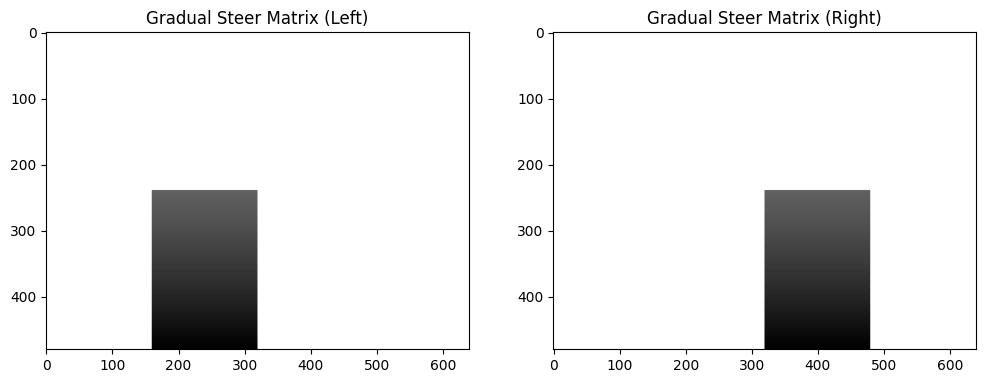

In [25]:
def generate_steer_left_matrix(shape):
    steer_matrix_left = np.zeros(shape)
    height, width = shape
    left_region_width = width // 4  # Adjustable width
    decay_rate = -0.002

    # Generate the decay values along the vertical axis
    decay_values = -np.exp(decay_rate * np.arange(height // 2, height)[::-1])

    # Apply decay values to the left region in the bottom half of the matrix
    steer_matrix_left[height // 2 :, width // 2 - left_region_width : width // 2] = (
        decay_values[:, np.newaxis]
    )

    return steer_matrix_left

def generate_steer_right_matrix(shape):
    steer_matrix_right = np.zeros(shape)
    height, width = shape
    right_region_width = width // 4  # Adjustable widthf
    decay_rate = -0.002

    # Generate the decay values along the vertical axis
    decay_values = np.exp(decay_rate * np.arange(height // 2, height)[::-1])

    # Apply decay values to the right region in the bottom half of the matrix
    steer_matrix_right[height // 2 :, width // 2 : width // 2 + right_region_width] = (
        decay_values[:, np.newaxis]
    )

    return steer_matrix_right

steer_left_matrix = generate_steer_left_matrix(img.shape)
steer_right_matrix = generate_steer_right_matrix(img.shape)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(steer_left_matrix * mask_left, cmap="gray")
ax1.set_title("Gradual Steer Matrix (Left)")
ax2.imshow(-steer_right_matrix * mask_right, cmap="gray")
ax2.set_title("Gradual Steer Matrix (Right)")
plt.show()

Sum img_steer_matrix_left: -76466.25835116088
Sum img_steer_matrix_right: 107448.93350272009
no img left: -18890.11799736186
no img right: 18890.117997361856
diff no img 37780.23599472371
diff with img -183915.19185388097


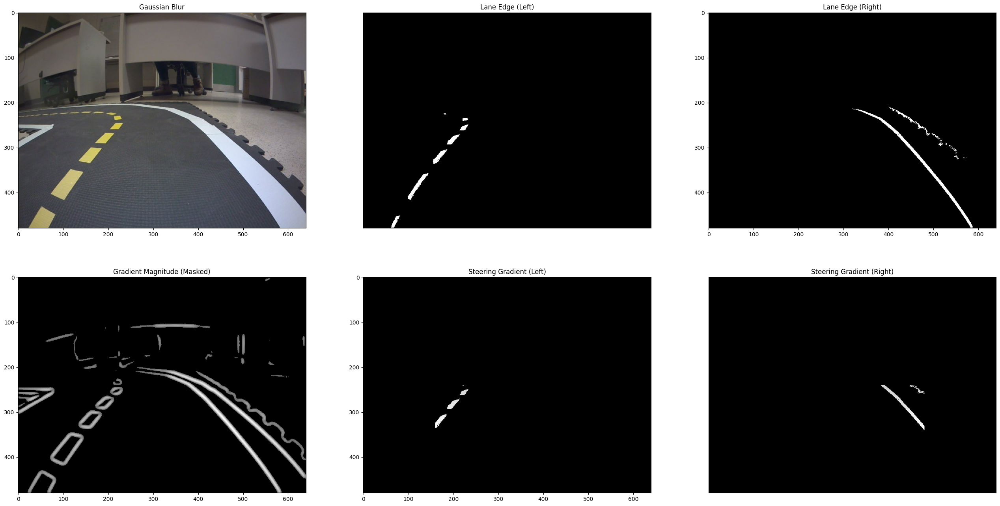

In [26]:
# Let's generate the complete set of masks, including those based on color
# Load in the image and generate hsv and grayscale versions
imgbgr = cv2.imread('../../images/image1.png')

# TODO: implement your own solution here
height, width, _ = imgbgr.shape

# Parameters to play around with
sigma = 4

# Colors
white_lower_hsv = np.array([0, 0, 167])
white_upper_hsv = np.array([179, 65, 255])
yellow_lower_hsv = np.array([20, 60, 75])
yellow_upper_hsv = np.array([45, 255, 255])

# 1) Processing the image
imgrgb = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
imghsv = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2HSV)
img = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2GRAY)

# 1.5) (Optional) Find the horizon and remove it
# Naive way
mask_ground = np.ones(img.shape, dtype=np.uint8)
mask_ground = cv2.warpPerspective(mask_ground, Hinv, (width, height))
mask_ground[:175] = 0

# 2) Smooth the image using a Gaussian kernel
img_gaussian_filter = cv2.GaussianBlur(img, (0, 0), sigma)

# 3) Convolve the image with the Sobel operator (filter) to compute the
sobelx = cv2.Sobel(img_gaussian_filter, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(img_gaussian_filter, cv2.CV_64F, 0, 1)
Gmag = np.sqrt(sobelx * sobelx + sobely * sobely)  # magnitude of gradients

# 4) Make a mask to clip filter out weaker gradients (form of non-maximal suppression)
# threshold = np.percentile(Gmag, percentile_threshold)
# threshold = np.max(Gmag) // 5  # Testing with this threshold to use most gradient
threshold_yellow = np.max(Gmag) // 6
threshold_white = np.max(Gmag) // 4
mask_mag_yellow = Gmag > threshold_yellow
mask_mag_white = Gmag > threshold_white

threshold = 45
mask_mag = Gmag > threshold

# 5) Let's create masks for the left and right halves of the image
mask_left = np.ones(sobelx.shape)
mask_left[:, int(np.floor(width / 2)) : width + 1] = 0
mask_right = np.ones(sobelx.shape)
mask_right[:, 0 : int(np.floor(width / 2))] = 0

# 6) Generate a mask that identifies pixels based on the sign of their x-derivative
mask_sobelx_pos = sobelx > 0
mask_sobelx_neg = sobelx < 0
mask_sobely_pos = sobely > 0
mask_sobely_neg = sobely < 0

# 7) White and yellow masks
mask_yellow = cv2.inRange(imghsv, yellow_lower_hsv, yellow_upper_hsv)
mask_white = cv2.inRange(imghsv, white_lower_hsv, white_upper_hsv)

# Let's generate the complete set of masks, including those based on color
mask_left_edge = (
    mask_ground * mask_left * mask_mag_yellow * mask_sobelx_neg * mask_sobely_neg * mask_yellow
)
mask_right_edge = (
    mask_ground * mask_right * mask_mag_white * mask_sobelx_pos * mask_sobely_neg * mask_white
)

shape = img.shape
steer_matrix_left = generate_steer_left_matrix(shape)
steer_matrix_right = generate_steer_right_matrix(shape)

# calculate steering
img_steer_matrix_left = steer_matrix_left * mask_left_edge
img_steer_matrix_right = steer_matrix_right * mask_right_edge
img_steer_matrix = img_steer_matrix_left + img_steer_matrix_right
print("Sum img_steer_matrix_left:", np.sum(img_steer_matrix_left))
print("Sum img_steer_matrix_right:", np.sum(img_steer_matrix_right))
print("no img left:", np.sum(steer_matrix_left))
print("no img right:", np.sum(steer_matrix_right))
print("diff no img", np.sum(steer_matrix_right - steer_matrix_left))
print("diff with img", np.sum(img_steer_matrix_left - img_steer_matrix_right))


fig = plt.figure(figsize=(32, 16))
ax0 = fig.add_subplot(2, 3, 1)
ax0.imshow(imgrgb, cmap="gray")
ax0.set_title("Gaussian Blur"), ax1.set_xticks([]), ax1.set_yticks([])
ax1 = fig.add_subplot(2, 3, 3)
ax1.imshow(mask_right_edge, cmap="gray")
ax1.set_title("Lane Edge (Right)"), ax4.set_xticks([]), ax4.set_yticks([])
ax2 = fig.add_subplot(2, 3, 2)
ax2.imshow(mask_left_edge, cmap="gray")
ax2.set_title("Lane Edge (Left)"), ax3.set_xticks([]), ax3.set_yticks([])
ax3 = fig.add_subplot(2, 3, 4)
ax3.imshow(mask_mag * Gmag, cmap="gray")
ax3.set_title("Gradient Magnitude (Masked)"), ax2.set_xticks([]), ax2.set_yticks([])
ax4 = fig.add_subplot(2, 3, 6)
ax4.imshow(steer_matrix_right * mask_right_edge, cmap="gray")
ax4.set_title("Steering Gradient (Right)"), ax4.set_xticks([]), ax4.set_yticks([])
ax5 = fig.add_subplot(2, 3, 5)
ax5.imshow(-steer_matrix_left * mask_left_edge, cmap="gray")
ax5.set_title("Steering Gradient (Left)"), ax4.set_xticks([]), ax4.set_yticks([])

# show
plt.show()

# 💻 🚙 Write the lane-following function

Now that we have an understanding of how we might go about detecting the left (dashed-yellow) and right (solid-white) lane markings, we can integrate these components into a reactive controller that seeks to keep the Duckiebot in its lane.

In particular, if the Duckiebot is commanded to travel forward at a fixed velocity, we can imagine controlling the steering (angular rate) as follows:


```python
steering  = np.sum( STEER_LEFT_LM * left_lane_markings_img) + np.sum( STEER_RIGHT_LM * right_lane_markings_img)
```

where `STEER_LEFT_LM` and `STEER_RIGHT_LM` are weight matrices that map the image-space locations of the detected left (dashed-yellow) lane markings to the steering (angular rate) commands.

In doing so we ask you to define two sets of functions:

1. A set of two functions that define these weight matrices;

2. A function that takes as input the image from the Duckiebot's camera and outputs two images, one corresponding to the image-space detections of the left (dashed-yellow) and right (solid-white) lane markings.

These functions will then be combined to control the Duckiebot.

## Define the left and right lane marking matrices

We will control the steering according to a weighted combination of the left and right lane markings. Implement the functions `get_steer_matrix_left_lane_markings()` and `get_steer_matrix_right_lane_markings()` inside the file [visual_servoing_solution.py](../../packages/visual_lane_servoing/include/visual_servoing_solution.py). These functions create weight matrices for the left and right lane markings respectively.

## Detecting the left and right lane markings 

Based on what we have learned above, implement the function `detect_lane_markings()` inside the file [visual_servoing_solution.py](../../packages/visual_lane_servoing/include/visual_servoing_solution.py) that takes as input the image from the Duckiebot's camera (in the BGR color space) and outputs two images, one corresponding to the filtered left (dashed-yellow) lane markings and the other for the right (solid-white) lane markings. These images can be in the form of the binary masks that we developed above.

The two lane marking images will then be used together with the weight matrices defined above to control the Duckiebot.

### Test the `detect_lane_markings()` function

As we have seen, unit tests are valuable in confirming that a particular piece of code works as intended when provided with an expected input.

Let's see if the function you wrote above passes the following test!

**Note: you might need to reload the kernel for the notebook to detect the changes you make.**

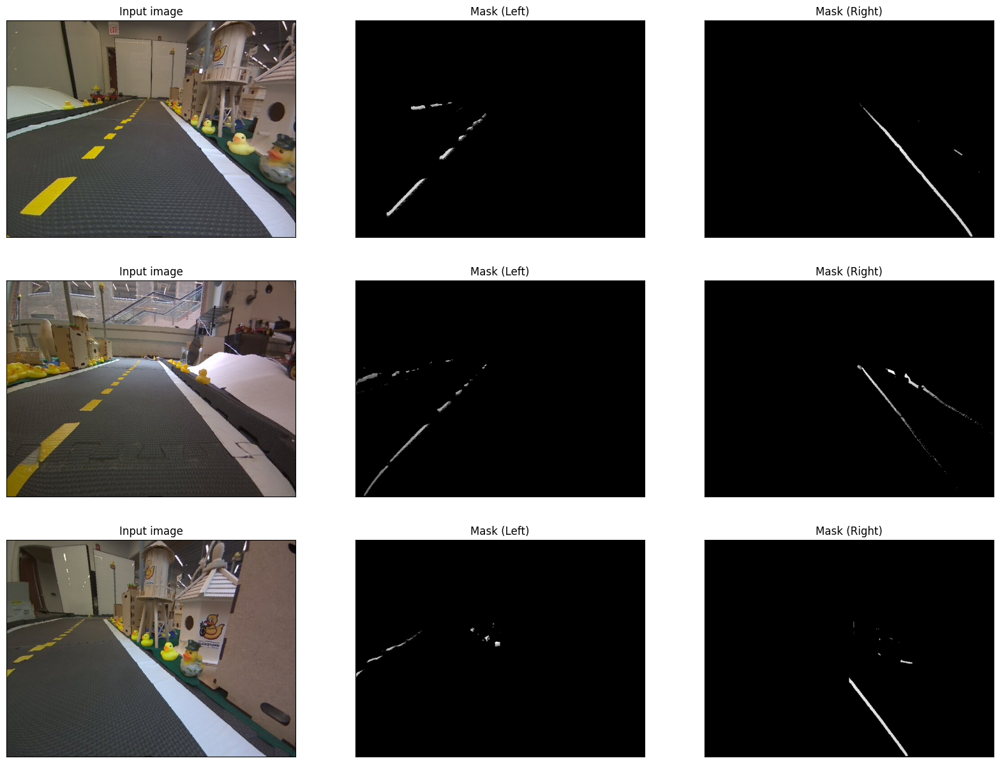

In [1]:
from unit_tests import UnitTestDLM
import visual_lane_servoing.include.visual_servoing_solution as solution

# The test provides an image to your detect_lane_markings function 
# and visualizes the left and right masks that it produced.

UnitTestDLM(solution.detect_lane_markings)

## 💡 Reflecting on the experience

The above strategy is a reasonable first approach to steering your Duckiebot in order to stay in its lane. Depending on your impelementation and your environment, you may even have found that it does a decent job staying in the lane, even around curves. However, as you have likely seen, there are a number of limitations of the approach:

* Our strategy for detecting lane markings and designing weight matrices limits the the road geometries that it the Duckiebot can handle. While it may do a decent job navigating gradual curves, it likely can't handle sharp turns or T-intersections, among others;

* The detection algorithm is sensitive to changes in illumination, which can result in failed detections (e.g., valid pixels are being filtered out as a result of color masking), and clutter, which can result in erroneous detections (e.g., your Duckiebot may hallucinate lane markings on the wall, on duckies, or elsewhere in the town) that cause the Duckiebot to steer in unpredictable ways.

Nonetheless, hopefully this introduced you to some of the core concepts of image filtering and how you might use it to control the motion of your Duckiebot. Hopefully, it also provided you with first-hand knowledge of some of the challenges of distilling information from images and using them for control, which should set the stage for upcoming topics in the class.